<img src='https://i.ibb.co/PQjhtPK/Logo-Datos-Vivos.png' width='400px'>

### Challenge propuesto por [Escuela de Datos Vivos](https://escueladedatosvivos.ai/)
#### Gracias [Pablo Casas](https://www.linkedin.com/in/ignacio-keegan-5b850122/) por los tips y recomendaciones!

# Analisis de datos de cancer de mama, por [Ignacio Keegan](https://www.linkedin.com/in/ignacio-keegan-5b850122/)
### Fuente: https://archive.ics.uci.edu/ml/datasets/breast+cancer+wisconsin+%28original%29

En este trabajo tomare el Breast Cancer Wisconsin (Original) Data Set para implementar modelos de clasificacion y regresion para predecir si el paciente tiene cancer o no. Luego de el analisis exploratorio, preparacion previa y seleccion de variables, empiezo con un modelo de regresion logistica que tiene buenos resultados pero para mejorar la capacidad de prediccion termino utilizando un RandomForestClassifier con parametros y punto de corte bien definidos

---

In [1]:
import pandas as pd
import numpy as np
from qgrid import show_grid
import seaborn as sns
from pandas_profiling import ProfileReport
from funpymodeling.exploratory import freq_tbl, status, profiling_num, cat_vars, num_vars,corr_pair
import matplotlib.pyplot as plt
from plotnine import *
from __future__ import division
from minepy import MINE

##### Los datos estan en formato DATA, los pase al formato csv

In [2]:
data = pd.read_csv("breast-cancer-wisconsin.csv")

##### Uso el ProfileReport para tener una primera vista de los datos

In [3]:
ProfileReport(data)

### Rapidamente, noto los siguientes puntos:

1. Tengo 8 datos duplicados
2. En general los datos estan bastante correlacionados entre si, 0,50 como minimo, eso significa que tengo que elegir bien las variables para mi modelo porque si elijo variables muy correlacionadas entre si mi modelo no va a funcionar (por ej Uniformity of Cell Size y Uniformity of Cell Shape, estan muy correlacionadas entre si, tengo que usar una o otra pero no las dos
3. El rango de los datos es bastante uniforme, de 1 al 10 en todos los casos, la distribucion varia por supuesto pero esto significa que no tengo que discretizar las variables
4. La variable Bare Nuclei tiene algunos nulos representados con un ?, voy a tener que resolverlo para convertir la variable en numerica

---

### Empezemos analizando los duplicados

##### Hay 8 datos duplicados, se repiten todos los valores en las columnas

In [4]:
data[data.duplicated()]

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
208,1218860,1,1,1,1,1,1,3,1,1,2
253,1100524,6,10,10,2,8,10,7,3,3,4
254,1116116,9,10,10,1,10,8,3,3,1,4
258,1198641,3,1,1,1,2,1,3,1,1,2
272,320675,3,3,5,2,3,10,7,1,1,4
338,704097,1,1,1,1,1,1,2,1,1,2
561,1321942,5,1,1,1,2,1,3,1,1,2
684,466906,1,1,1,1,2,1,1,1,1,2


##### Hay 54 datos duplicados de la variable ID 'Sample code number', mi opinion es no eliminarlos dado que las muestras pueden 
##### variar y si dan resultados diferentes es informacion valiosa para el modelo

In [5]:
data[data.duplicated('Sample code number')].shape[0]

54

##### Elimino los 8 duplicados

In [6]:
data.drop_duplicates(inplace = True)

In [7]:
data = data.reset_index() 

In [8]:
data.drop(['index','Sample code number'],axis = 1,inplace = True)

---

#### Para el modelo, reemplazo los valores 2 (no tiene cancer) y 4 (tiene cancer) por 0 y 1

In [9]:
data['Class'] = data['Class'].replace(2,0)
data['Class'] = data['Class'].replace(4,1)

#### Dado que no necesito discretizar las variables y considerando que son solo 16 datos de este tipo, tome la decision de usar 
#### la mediana para reemplazar los valores

In [10]:
data[data['Bare Nuclei'] != '?']['Bare Nuclei'].median()

1.0

##### De esta manera, puedo convertir la variable en Bare Nuclei como numerica

In [11]:
data['Bare Nuclei'] = data['Bare Nuclei'].replace('?',1)

In [12]:
data['Bare Nuclei'] = data['Bare Nuclei'].astype(np.int64)

In [13]:
data.dtypes

Clump Thickness                int64
Uniformity of Cell Size        int64
Uniformity of Cell Shape       int64
Marginal Adhesion              int64
Single Epithelial Cell Size    int64
Bare Nuclei                    int64
Bland Chromatin                int64
Normal Nucleoli                int64
Mitoses                        int64
Class                          int64
dtype: object

##### Un vistazo general de la distribucion de los datos, se puede ver como en general los datos tienen una distribucion parecida

In [14]:
profiling_num(data)

,variable,mean,std_dev,variation_coef,p_0.01,p_0.05,p_0.25,p_0.5,p_0.75,p_0.95,p_0.99
0,Clump Thickness,4.426918,2.815861,0.636077,1.0,1.0,2.0,4.0,6.0,10.0,10.0
1,Uniformity of Cell Size,3.130246,3.041328,0.971594,1.0,1.0,1.0,1.0,5.0,10.0,10.0
2,Uniformity of Cell Shape,3.201158,2.959886,0.924630,1.0,1.0,1.0,1.0,5.0,10.0,10.0
3,Marginal Adhesion,2.824891,2.866552,1.014748,1.0,1.0,1.0,1.0,4.0,10.0,10.0
4,Single Epithelial Cell Size,3.211288,2.199852,0.685037,1.0,1.0,2.0,2.0,4.0,8.0,10.0
5,Bare Nuclei,3.479016,3.615676,1.039281,1.0,1.0,1.0,1.0,5.0,10.0,10.0
6,Bland Chromatin,3.435601,2.442345,0.710893,1.0,1.0,2.0,3.0,5.0,8.0,10.0
7,Normal Nucleoli,2.882779,3.066298,1.063660,1.0,1.0,1.0,1.0,4.0,10.0,10.0
8,Mitoses,1.593343,1.723129,1.081455,1.0,1.0,1.0,1.0,1.0,5.0,10.0
9,Class,0.344428,0.475526,1.380623,0.0,0.0,0.0,0.0,1.0,1.0,1.0


---

#### La correlacion muestra con el problema del punto 2, como se correlacionan las variables entre si y como casi todas las 
#### variables estan fuertemente correlacionadas con nuestro target

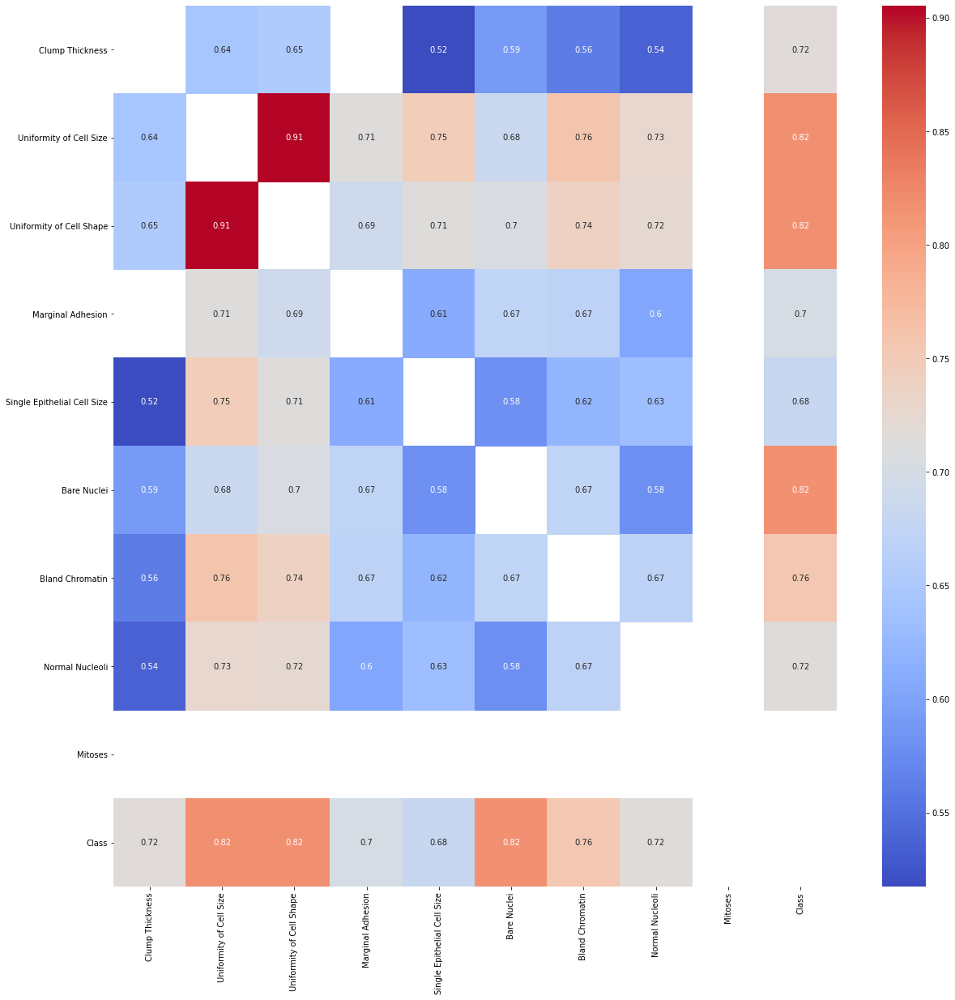

In [15]:
dfCorr = data.corr()
filteredDf = dfCorr[((dfCorr >= .5) | (dfCorr <= -.5)) & (dfCorr !=1.000)]
plt.figure(figsize=(20,20))
sns.heatmap(filteredDf, annot=True, cmap="coolwarm")
plt.show()

In [32]:
from funpymodeling.exploratory import corr_pair
show_grid(corr_pair(data).sort_values(by = 'R2',ascending = False))

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

#### Ahora, problemos la medida con MIC, para constrastarlo con la correlacion Pearson

In [33]:
import itertools
col_pairs=list(itertools.combinations(data.columns, 2))

In [34]:
df_res = pd.DataFrame()

In [35]:
for a,b in col_pairs:
    mine = MINE(alpha=0.6, c=15, est="mic_approx")
    mine.compute_score(data[a], data[b])
    df_res=df_res.append({"v1":a, "v2":b, "mic":mine.mic()}, ignore_index=True)

In [36]:
show_grid(df_res.sort_values(by = 'mic',ascending = False))

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

##### Segun la correlacion Pearson y MIC vemos que:

* Las dos medidas se comportan de forma muy parecida, sin grandes diferencias entre si

##### 1) Variables fuertmente correlacionadas con class: 
* Uniformity of Cell Shape 
* Bare Nuclei,Bland Chromatin 
* Single Epithelial Cell Size 
* Normal Nucleoli 
* Clump Thickness 
* Marginal Adhesion

##### 2) Variables fuertemente correlacionadas entre si con un mic mayor a 0.4:

* Uniformity of Cell Size y Uniformity of Cell Shape
* Single Epithelial Cell Size y Uniformity of Cell Size
* Uniformity of Cell Size y Bland Chromatin
* Uniformity of Cell Shape y Single Epithelial Cell Size
* Uniformity of Cell Size,Bare Nuclei
* Single Epithelial Cell Size y Normal Nucleoli
* Bare Nuclei y Bland Chromatin
* Single Epithelial Cell Size y Bland Chromatin
* Single Epithelial Cell Size y Bare Nuclei

------------------------------------------------------------------------------------------------------------------------------

### Creacion del Modelo

In [21]:
x_data=data.drop(['Class'], axis=1)
y_data=data['Class']

##### Para el modelo, usare las siguientes variables que considero que no estan tan correlacionadas entre si y tienen una fuerte relacion con class

In [22]:
x_data = x_data[['Uniformity of Cell Shape','Bare Nuclei','Normal Nucleoli','Clump Thickness']]

In [23]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.2)

##### Primero, probemos una regresion logistica 

In [24]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

model.fit(x_train, y_train)

pred_tr=model.predict(x_train)
pred_ts=model.predict(x_test)

##### Podemos ver que el modelo nos da una tasa de acierto bastante alta y el modelo marca claramente que es positivo y que es negativo sin , habria que 
##### investigar como reducir los falsos negativos dado que estamos trabajando con datos que predicen cancer

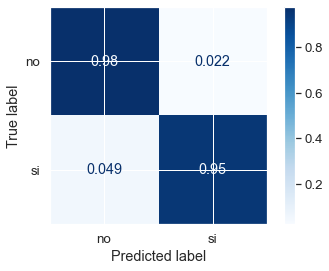

In [25]:
from sklearn.metrics import plot_confusion_matrix

sns.set(font_scale=1.2)

plot_confusion_matrix(model, x_train, y_train,
                      display_labels=['no','si'],
                      cmap='Blues',
                      normalize='true',
                     )

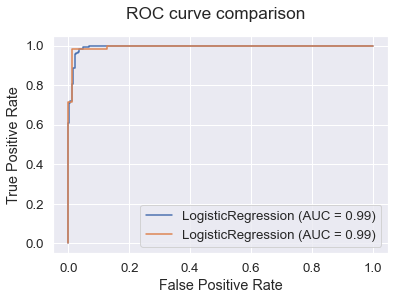

In [26]:
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt

tr_disp = plot_roc_curve(model, x_train, y_train)
ts_disp = plot_roc_curve(model, x_test, y_test, ax=tr_disp.ax_)
ts_disp.figure_.suptitle("ROC curve comparison")

plt.show()

##### El score del modelo da muy alto, sin mucha diferencia entre training y testing

In [27]:
model.score(x_train, y_train)

0.9692028985507246

In [28]:
model.score(x_test, y_test)

0.9640287769784173

---

#### Ahora, probemos la clasificacion un RandomForest para ver como se compara con la regresion logistica, hice algo de 
#### hypertuning para encontrar los mejores valores

In [37]:
from sklearn.ensemble import RandomForestClassifier 

model_rf = RandomForestClassifier(max_features=2, min_samples_leaf=5, min_samples_split=10,n_estimators=50)

In [ ]:
params = {
    'n_estimators' : [10,25,50,100],
    'min_samples_split': [5,8,10],
    'min_samples_leaf': [5,15,25],
    'max_features': [1,2,4],
}

grid_rf = GridSearchCV(estimator = model_rf,
                        param_grid = params,
                        scoring = 'neg_mean_absolute_error',  # 
                        cv = 5, 
                        verbose = 1,
                        n_jobs = -1)

In [38]:
model_rf.fit(x_train, y_train)

RandomForestClassifier(max_features=2, min_samples_leaf=5, min_samples_split=10,
                       n_estimators=50)

##### Definitivamente este modelo es levemente superior para predecir si tiene cancer o no, 98% en TN y 98% en TP, solo 2% de error tipo 1 y 2% de error tipo 2

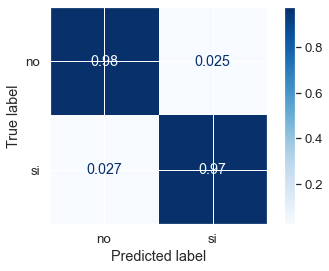

In [39]:
from sklearn.metrics import plot_confusion_matrix

sns.set(font_scale=1.2) #  Ajuste tamaño de letra (var global)

plot_confusion_matrix(model_rf, x_train, y_train,
                      display_labels=['no','si'],
                      cmap='Blues',
                      normalize='true',
                     )

##### La curva ROC claramente muestra que el modelo marca claramente que es positivo y que es negativo sin muchas ambiguedades

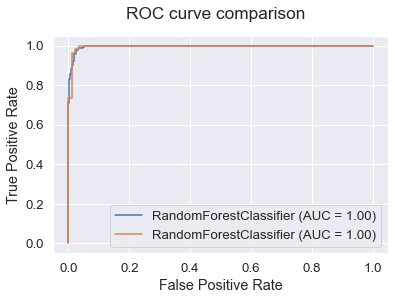

In [40]:
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt

tr_disp = plot_roc_curve(model_rf, x_train, y_train)
ts_disp = plot_roc_curve(model_rf, x_test, y_test, ax=tr_disp.ax_)
ts_disp.figure_.suptitle("ROC curve comparison")

plt.show()

In [41]:
model_rf.score(x_train, y_train)

0.9746376811594203

In [42]:
model_rf.score(x_test, y_test)

0.9712230215827338

---

#### Modificar el punto de corte del Modelo Clasificatorio (Gracias Alexis Quintana por la explicacion)

In [43]:
predictions_tr = model_rf.predict_proba(x_train)[:,1]
predictions_tr.mean()

0.333035138069219

##### Probando con un punto de corte muy bajo, 0,5 logro que el modelo no tenga falsos negativos pero aumento la cantidad de falsos positivos

In [44]:
y_pred_tr = np.where(predictions_tr > 0.05, 1, 0)

<AxesSubplot:xlabel='Pred', ylabel='Actual'>

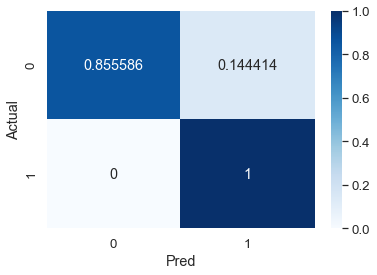

In [45]:
conf_mat2=pd.crosstab(index=y_train, 
                      columns=y_pred_tr, 
                      rownames=['Actual'], 
                      colnames=['Pred'], 
                      normalize='index')

import seaborn as sns
sns.heatmap(conf_mat2, annot=True, cmap='Blues', fmt='g')

##### Con 0,2 tengo el mismo resultado con mejor poder predictivo

In [46]:
y_pred_tr = np.where(predictions_tr > 0.2, 1, 0)

<AxesSubplot:xlabel='Pred', ylabel='Actual'>

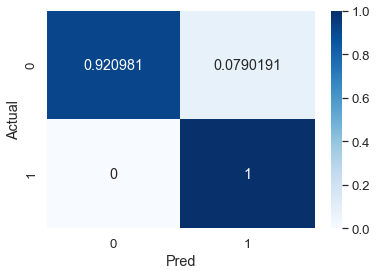

In [47]:
conf_mat2=pd.crosstab(index=y_train, 
                      columns=y_pred_tr, 
                      rownames=['Actual'], 
                      colnames=['Pred'], 
                      normalize='index')

import seaborn as sns
sns.heatmap(conf_mat2, annot=True, cmap='Blues', fmt='g')

##### Probandolo en testing, tengo resultados similares al primer modelo de RF pero sin falsos negativos

In [48]:
predictions_ts = model_rf.predict_proba(x_test)[:,1]

In [49]:
y_pred_ts = np.where(predictions_ts > 0.2, 1, 0)

<AxesSubplot:xlabel='Pred', ylabel='Actual'>

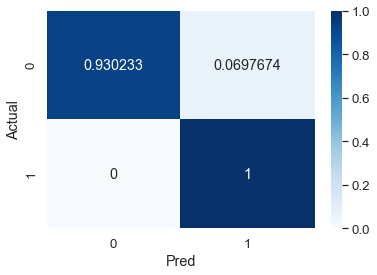

In [50]:
conf_mat2=pd.crosstab(index=y_test, 
                      columns=y_pred_ts, 
                      rownames=['Actual'], 
                      colnames=['Pred'], 
                      normalize='index')

import seaborn as sns
sns.heatmap(conf_mat2, annot=True, cmap='Blues', fmt='g')

---

### Conclusiones

* Si bien el modelo predice muy bien, esta basado en un dataset de 699 datos, claramente necesitaria tener mas testing de otros datos similares

* El RandomForestClassifier con un punto de corte en 0,2 es el mejor modelo para predecir si tiene cancer o no